# ***Predictive Modeling of Critical Temperatures for Superconductors***

***Name :*** Lis Mary Antony 

***Organization :*** Entri Elevate

***Date :*** (Evaluation Date)

## 1. **Overview of Problem Statement:**

   The critical temperature *(Tc)* of superconductors determines their ability to exhibit superconducting properties, which are vital for applications in energy transmission, magnetic levitation, and quantum computing. Accurately predicting *Tc* is a challenging task due to the intricate relationships between material properties such as atomic mass, thermal conductivity, and electron affinity. Developing a robust predictive model can accelerate the discovery and design of high- *Tc* materials, revolutionizing advancements in material science and technology.

## 2. **Objective:**

   To develop the best predictive model for accurately estimating the critical temperature (*Tc*) of superconductors using machine learning techniques, enabling advancements in material design for energy-efficient and cutting-edge technological applications.

## 3. **Data Description:**

***Source of Data :*** UCI repository

***Shape :*** Rows: 21263 x Columns: 82


***Features :*** 


**Atomic Mass Features:**
mean_atomic_mass, wtd_mean_atomic_mass (weighted mean), gmean_atomic_mass (geometric mean), entropy_atomic_mass, etc.

**Ionization Energy Features:**
mean_fie (first ionization energy), wtd_mean_fie, entropy_fie, etc.

**Atomic Radius Features:**
mean_atomic_radius, wtd_mean_atomic_radius, entropy_atomic_radius, etc.

**Density Features:**
mean_Density, wtd_mean_Density, entropy_Density, etc.

**Electron Affinity Features:**
mean_ElectronAffinity, wtd_mean_ElectronAffinity, entropy_ElectronAffinity, etc.

**Fusion Heat Features:**
mean_FusionHeat, wtd_mean_FusionHeat, entropy_FusionHeat, etc.

**Thermal Conductivity Features:**
mean_ThermalConductivity, wtd_mean_ThermalConductivity, entropy_ThermalConductivity, etc.

**Valence Features:**
mean_Valence, wtd_mean_Valence, entropy_Valence, etc.

**Range, Standard Deviation, and Weighted Variants:**
For each category above, the dataset includes features like range, std, and weighted variants.

***Target Variable:***
critical_temp (Critical Temperature in Kelvin) — the temperature below which the material exhibits superconductivity.

***Total Features: 81 features + 1 target column.***

## 4. **Data Collection**

Importing the python libraries

In [108]:
import numpy as np 
import pandas as pd 

import matplotlib.pyplot as plt 
import seaborn as sns 

%matplotlib inline

import warnings 
warnings.filterwarnings('ignore') 

from sklearn.preprocessing import PowerTransformer 
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV 
from sklearn.preprocessing import StandardScaler, MinMaxScaler 
from sklearn.feature_selection import SelectKBest, f_regression, RFE 
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score 
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor 
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor 
from sklearn.svm import SVR 
from scipy.stats import uniform 
from sklearn.pipeline import Pipeline

In [110]:
# Loading the dataset

data = pd.read_csv("SC.csv")

In [112]:
# Converting to dataframe

df= pd.DataFrame(data)

In [13]:
# Getting the summary of dataframe

print("\nSummary of DataFrame:\n")
df.info()


Summary of DataFrame:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21263 entries, 0 to 21262
Data columns (total 82 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   number_of_elements               21263 non-null  int64  
 1   mean_atomic_mass                 21263 non-null  float64
 2   wtd_mean_atomic_mass             21263 non-null  float64
 3   gmean_atomic_mass                21263 non-null  float64
 4   wtd_gmean_atomic_mass            21263 non-null  float64
 5   entropy_atomic_mass              21263 non-null  float64
 6   wtd_entropy_atomic_mass          21263 non-null  float64
 7   range_atomic_mass                21263 non-null  float64
 8   wtd_range_atomic_mass            21263 non-null  float64
 9   std_atomic_mass                  21263 non-null  float64
 10  wtd_std_atomic_mass              21263 non-null  float64
 11  mean_fie                         21263 non-null  float64

In [15]:
# First 5 rows of dataframe

df.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
0,4,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.90607,31.794921,51.968828,...,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.0
1,5,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.90607,36.161939,47.094633,...,2.257143,1.888175,2.210679,1.557113,1.047221,2,1.128571,0.632456,0.468606,26.0
2,4,88.944468,57.885242,66.361592,36.122509,1.181795,0.975980,122.90607,35.741099,51.968828,...,2.271429,2.213364,2.232679,1.368922,1.029175,1,1.114286,0.433013,0.444697,19.0
3,4,88.944468,57.873967,66.361592,36.119560,1.181795,1.022291,122.90607,33.768010,51.968828,...,2.264286,2.213364,2.226222,1.368922,1.048834,1,1.100000,0.433013,0.440952,22.0
4,4,88.944468,57.840143,66.361592,36.110716,1.181795,1.129224,122.90607,27.848743,51.968828,...,2.242857,2.213364,2.206963,1.368922,1.096052,1,1.057143,0.433013,0.428809,23.0


In [17]:
# Last 5 rows of dataframe

df.tail()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
21258,4,106.957877,53.095769,82.515384,43.135565,1.177145,1.254119,146.88130,15.504479,65.764081,...,3.555556,3.223710,3.519911,1.377820,0.913658,1,2.168889,0.433013,0.496904,2.44
21259,5,92.266740,49.021367,64.812662,32.867748,1.323287,1.571630,188.38390,7.353333,69.232655,...,2.047619,2.168944,2.038991,1.594167,1.337246,1,0.904762,0.400000,0.212959,122.10
21260,2,99.663190,95.609104,99.433882,95.464320,0.690847,0.530198,13.51362,53.041104,6.756810,...,4.800000,4.472136,4.781762,0.686962,0.450561,1,3.200000,0.500000,0.400000,1.98
21261,2,99.663190,97.095602,99.433882,96.901083,0.690847,0.640883,13.51362,31.115202,6.756810,...,4.690000,4.472136,4.665819,0.686962,0.577601,1,2.210000,0.500000,0.462493,1.84
21262,3,87.468333,86.858500,82.555758,80.458722,1.041270,0.895229,71.75500,43.144000,29.905282,...,4.500000,4.762203,4.242641,1.054920,0.970116,3,1.800000,1.414214,1.500000,12.80


In [19]:
# dimensions of DataFrame

df.shape

(21263, 82)

In [21]:
# getting descriptive statistics of numerical

df.describe()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
count,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,...,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000
mean,4.115224,87.557631,72.988310,71.290627,58.539916,1.165608,1.063884,115.601251,33.225218,44.391893,...,3.153127,3.056536,3.055885,1.295682,1.052841,2.041010,1.483007,0.839342,0.673987,34.421219
std,1.439295,29.676497,33.490406,31.030272,36.651067,0.364930,0.401423,54.626887,26.967752,20.035430,...,1.191249,1.046257,1.174815,0.393155,0.380291,1.242345,0.978176,0.484676,0.455580,34.254362
min,1.000000,6.941000,6.423452,5.320573,1.960849,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000210
25%,3.000000,72.458076,52.143839,58.041225,35.248990,0.966676,0.775363,78.512902,16.824174,32.890369,...,2.116732,2.279705,2.091251,1.060857,0.775678,1.000000,0.921454,0.451754,0.306892,5.365000
50%,4.000000,84.922750,60.696571,66.361592,39.918385,1.199541,1.146783,122.906070,26.636008,45.123500,...,2.618182,2.615321,2.434057,1.368922,1.166532,2.000000,1.063077,0.800000,0.500000,20.000000
75%,5.000000,100.404410,86.103540,78.116681,73.113234,1.444537,1.359418,154.119320,38.356908,59.322812,...,4.026201,3.727919,3.914868,1.589027,1.330801,3.000000,1.918400,1.200000,1.020436,63.000000
max,9.000000,208.980400,208.980400,208.980400,208.980400,1.983797,1.958203,207.972460,205.589910,101.019700,...,7.000000,7.000000,7.000000,2.141963,1.949739,6.000000,6.992200,3.000000,3.000000,185.000000


In [23]:
# Renaming columns

df = df.rename(columns={'critical_temp': 'Critical_Temperature'})

In [45]:
# column labels

df.columns

Index(['number_of_elements', 'mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'entropy_atomic_mass',
       'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
       'std_atomic_mass', 'wtd_std_atomic_mass', 'mean_fie', 'wtd_mean_fie',
       'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
       'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie',
       'mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius',
       'wtd_gmean_atomic_radius', 'entropy_atomic_radius',
       'wtd_entropy_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius',
       'mean_Density', 'wtd_mean_Density', 'gmean_Density',
       'wtd_gmean_Density', 'entropy_Density', 'wtd_entropy_Density',
       'range_Density', 'wtd_range_Density', 'std_Density', 'wtd_std_Density',
       'mean_ElectronAffinity', 'wtd_mean_ElectronAffinity',
       'gmean_

## 5. **Data Preprocessing - Data Cleaning:**

In [47]:
#  check for missing values

df.isnull().sum()

number_of_elements       0
mean_atomic_mass         0
wtd_mean_atomic_mass     0
gmean_atomic_mass        0
wtd_gmean_atomic_mass    0
                        ..
range_Valence            0
wtd_range_Valence        0
std_Valence              0
wtd_std_Valence          0
Critical_Temperature     0
Length: 82, dtype: int64

In [33]:
# check for duplicate rows

df.duplicated().sum()

66

In [62]:
# remove duplicate rows

df1 = df.drop_duplicates()

In [37]:
# check for any remaining duplicate rows

df1.duplicated().sum()

0

In [64]:
# select the numeric columns

numeric_columns = df1.select_dtypes(include = ['number']).columns

In [66]:
# Print total numerical features and their names

print("Total Numerical Features:",numeric_columns.shape)
print("Numeric Features:",numeric_columns)

Total Numerical Features: (82,)
Numeric Features: Index(['number_of_elements', 'mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'entropy_atomic_mass',
       'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
       'std_atomic_mass', 'wtd_std_atomic_mass', 'mean_fie', 'wtd_mean_fie',
       'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
       'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie',
       'mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius',
       'wtd_gmean_atomic_radius', 'entropy_atomic_radius',
       'wtd_entropy_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius',
       'mean_Density', 'wtd_mean_Density', 'gmean_Density',
       'wtd_gmean_Density', 'entropy_Density', 'wtd_entropy_Density',
       'range_Density', 'wtd_range_Density', 'std_Density', 'wtd_std_Density',
       'mean_ElectronAffi

In [68]:
# total number of categorical features and the names

categorical_columns = df1.select_dtypes(include='object').columns
print("Total Categorical Features:",categorical_columns.shape)
print("Categorical Features:",categorical_columns)

Total Categorical Features: (0,)
Categorical Features: Index([], dtype='object')


In [70]:
# columns with numeric data type 

num_columns = df1.select_dtypes(include = ['number'])

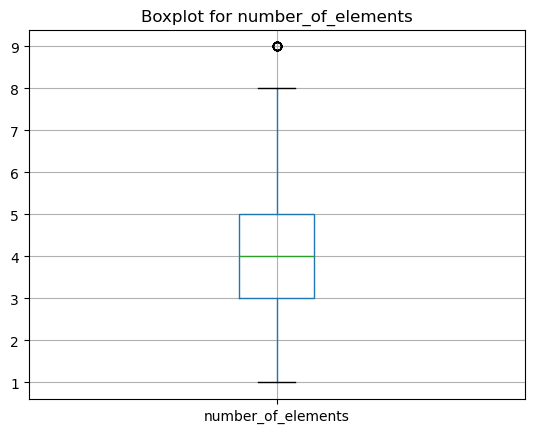

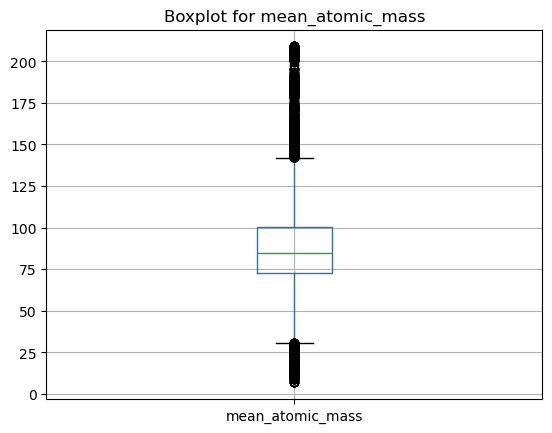

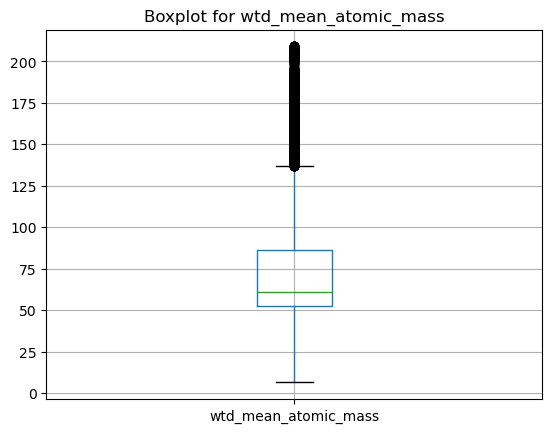

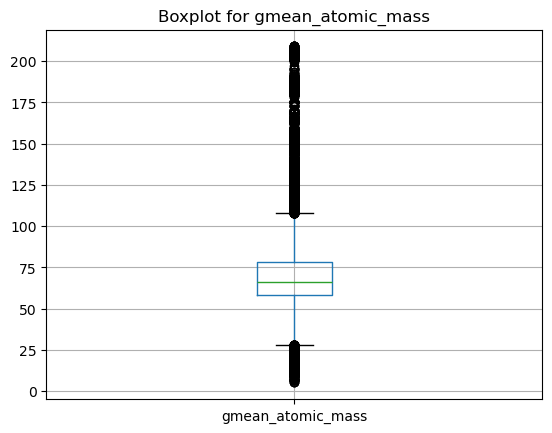

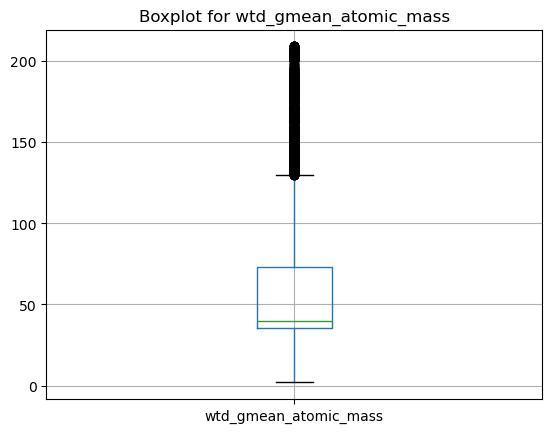

...

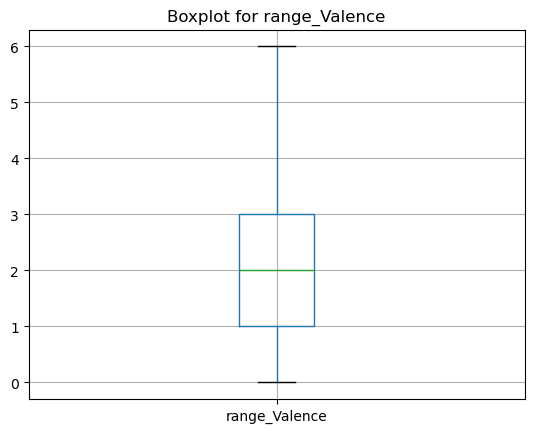

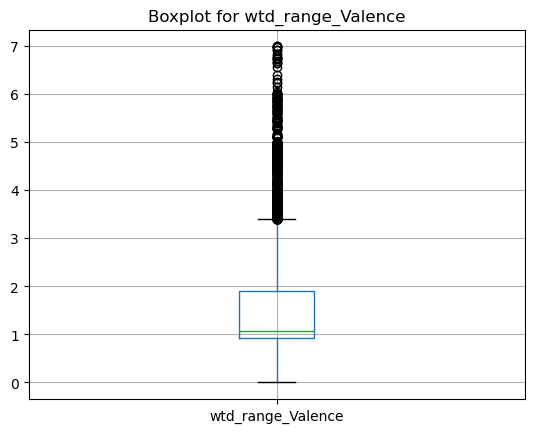

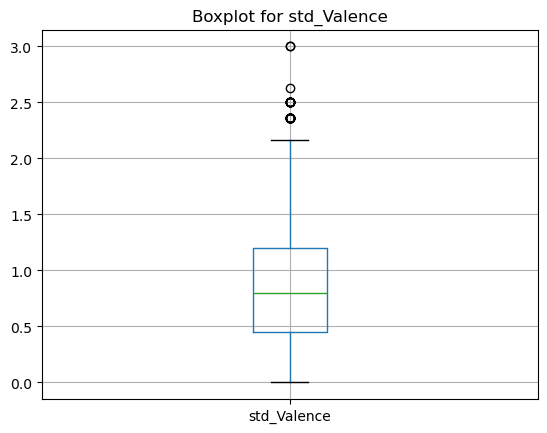

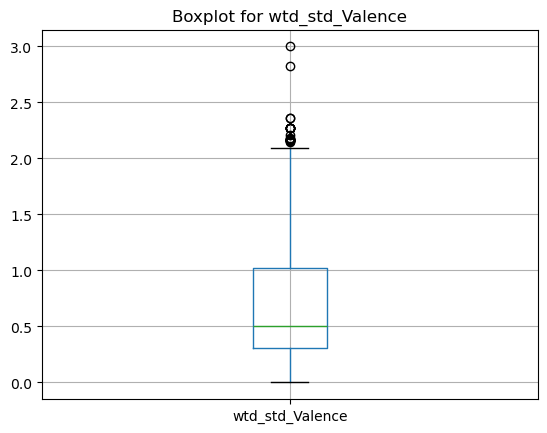

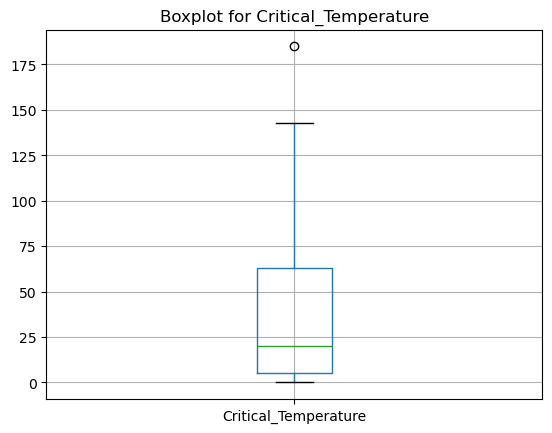

In [72]:
# separate boxplots for each numeric column 

for column in num_columns.columns:
    plt.figure()
    num_columns.boxplot(column = column)
    plt.title(f"Boxplot for {column}")

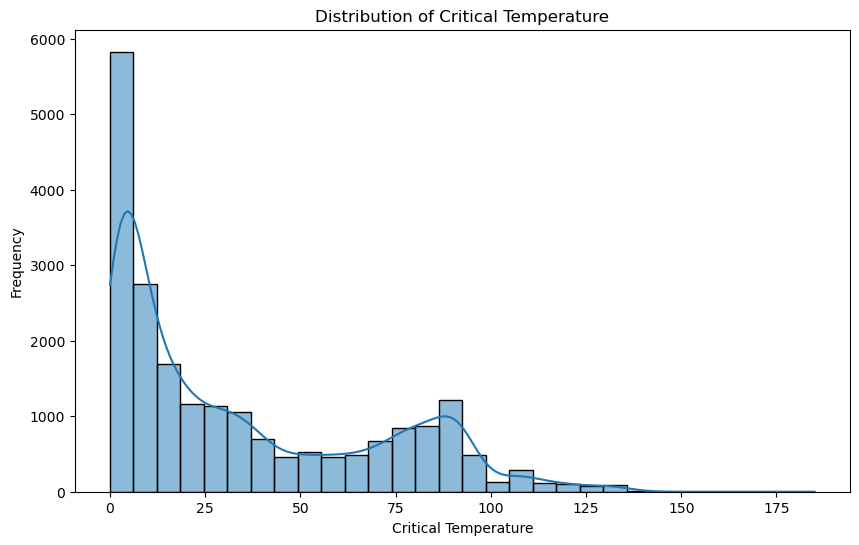

In [74]:
# generates a histogram for the Critical_Temperature column

plt.figure(figsize=(10,6))
sns.histplot(df1['Critical_Temperature'], bins=30, kde=True)
plt.title('Distribution of Critical Temperature') # Set the title of the plot
plt.xlabel('Critical Temperature') # Set the label for the x-axis
plt.ylabel('Frequency') # Set the label for y-axis
plt.show()

***Outliner Handling***

In [78]:
# Calculate Q1, Q3, and IQR
Q1 = df1[numeric_columns].quantile(0.25)
Q3 = df1[numeric_columns].quantile(0.75)
IQR = Q3 - Q1

In [80]:
# Define outlier thresholds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

In [82]:
outliers = ((df1[numeric_columns] < lower_bound) | (df1[numeric_columns] > upper_bound))
print("Number of outliers in each column:")
print(outliers.sum())

Number of outliers in each column:
number_of_elements         14
mean_atomic_mass         1604
wtd_mean_atomic_mass     1239
gmean_atomic_mass        3324
wtd_gmean_atomic_mass    1240
                         ... 
range_Valence               0
wtd_range_Valence        1447
std_Valence                44
wtd_std_Valence            25
Critical_Temperature        1
Length: 82, dtype: int64


In [100]:
# Define function for handling outliner using IQR

def handle_outliners_iqr(df):
    for col in df1.select_dtypes(include=['int64', 'float64']).columns:
        Q1 = df1[col].quantile(0.25)
        Q3 = df1[col].quantile(0.75)
        IQR = Q3 - Q1
        
        # Define lower and upper bounds
        lower = Q1 - (1.5*IQR)
        upper = Q3 + (1.5*IQR)
        
        # Cap the outliners using capping (Winsorizing)
        df1[col] = df1[col].apply(lambda x: lower if x < lower else upper if x > upper else x)

    return df

df2 = handle_outliners_iqr(df1)

In [106]:
print("Shape after capping outliers:", df2[numeric_columns].shape)

Shape after capping outliers: (21197, 82)


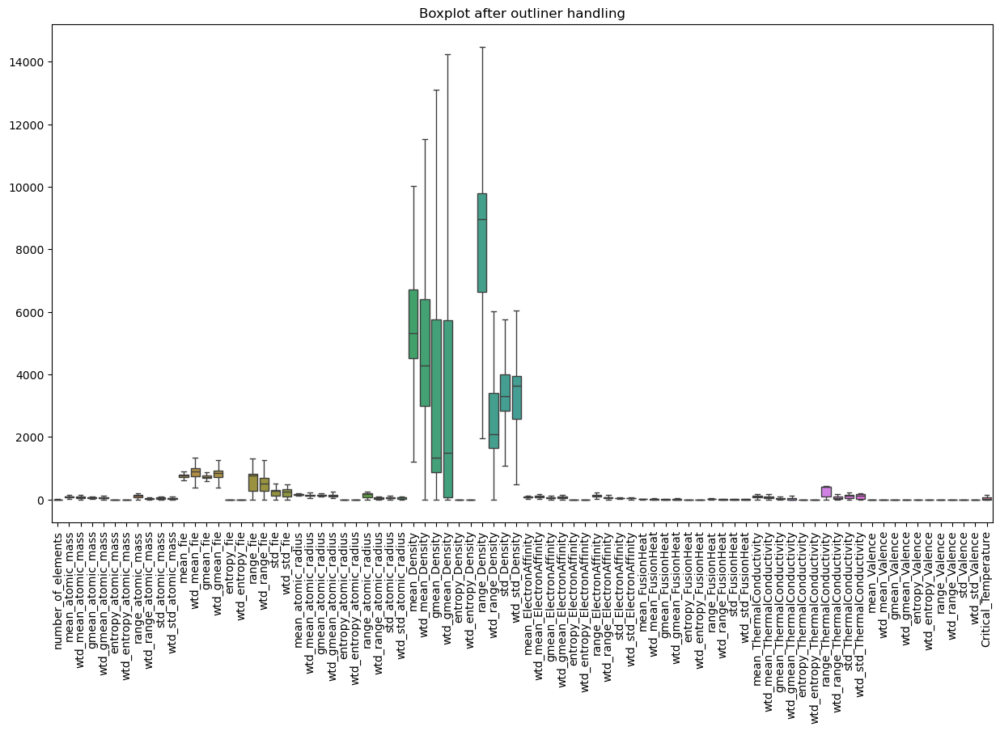

In [114]:
# generating a boxplot for the DataFrame df2 after handling outliers

plt.figure(figsize=(15,8))
sns.boxplot(data=df2)
plt.title('Boxplot after outliner handling')
plt.xticks(rotation = 90)
plt.show()

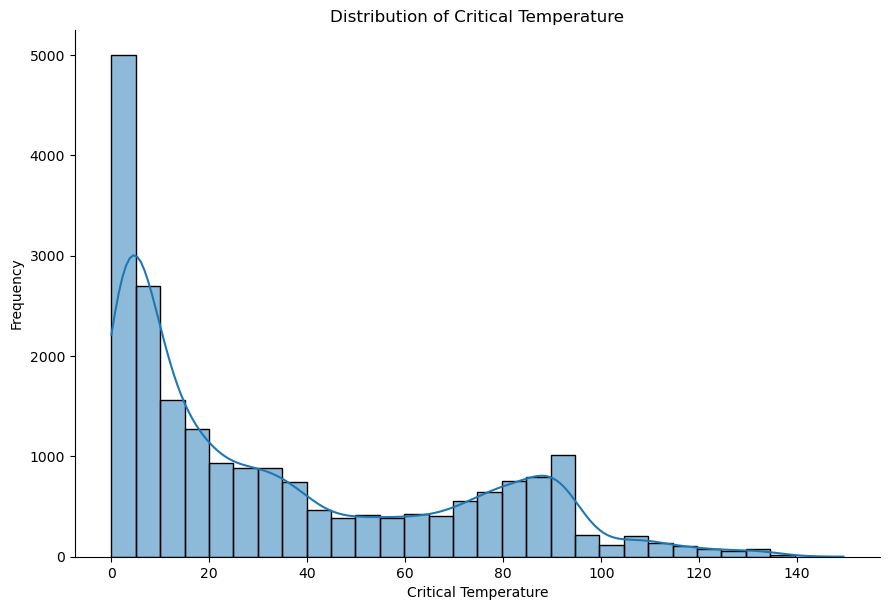

In [116]:
#  generating a distribution plot before transformation

sns.displot(df2['Critical_Temperature'], bins=30, kde=True, height=6, aspect=1.5) # Create the distribution plot
plt.title('Distribution of Critical Temperature') # Set the title of the plot
plt.xlabel('Critical Temperature') # Set the label for the x-axis
plt.ylabel('Frequency') # Set the label fot the y-axis
plt.show()

***Skewness Addressing***

In [121]:
# Check skewness of numerical columns

numerical_features = df2.select_dtypes(include=['float64', 'int64']).columns


In [129]:
skewness = df2[numerical_features].skew()

# Categorize skewness
fairly_skewness = skewness[(skewness >= -0.5) & (skewness <= 0.5)]
moderate_skewness = skewness[(skewness > 0.5) & (skewness <= 1) | (skewness < -0.5) & (skewness >= -1)]
high_skewness = skewness[(skewness > 1) | (skewness < -1)]

In [131]:
# Displaying results
print("Skewness of Numeric Columns:\n", skewness)
print("\nFairly Skewness:\n", fairly_skewness)
print("\nModerate Skewness:\n", moderate_skewness)
print("\nHigh Skewness:\n", high_skewness)

Skewness of Numeric Columns:
 number_of_elements      -0.006686
mean_atomic_mass         0.238592
wtd_mean_atomic_mass     0.775944
gmean_atomic_mass        0.274809
wtd_gmean_atomic_mass    1.075224
                           ...   
range_Valence            0.467163
wtd_range_Valence        1.066129
std_Valence              0.430518
wtd_std_Valence          0.643303
Critical_Temperature     0.854317
Length: 82, dtype: float64

Fairly Skewness:
 number_of_elements                -0.006686
mean_atomic_mass                   0.238592
gmean_atomic_mass                  0.274809
range_atomic_mass                 -0.380418
std_atomic_mass                   -0.351072
wtd_std_atomic_mass               -0.312935
mean_fie                           0.145773
wtd_mean_fie                      -0.293684
gmean_fie                          0.429697
wtd_gmean_fie                     -0.320259
wtd_entropy_fie                    0.108396
range_fie                         -0.462307
wtd_range_fie         

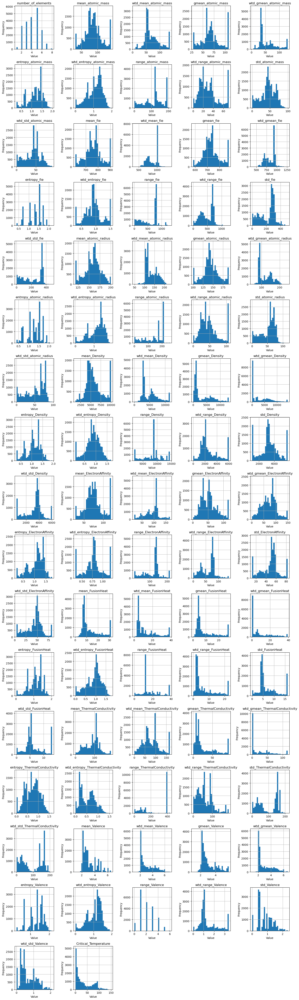

In [137]:
# Plot histograms before transformed features


# Set up the number of rows and columns for the subplot grid
n_cols = 5  # Number of columns in the grid (you can adjust this)
n_rows = (df2.shape[1] // n_cols) + (df2.shape[1] % n_cols > 0)  # Calculate number of rows

# Create the figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))  # Adjust figure size
axes = axes.flatten()  # Flatten to make iterating easier

# Loop through columns and plot each histogram
for i, column in enumerate(df2.columns):
    df2[column].hist(ax=axes[i], bins=30)
    axes[i].set_title(f'{column}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')

# Remove any empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

In [145]:
# Apply Yeo - Johnson transformation (works for both positive and negative values)

pt = PowerTransformer(method='yeo-johnson')
df2[numerical_features] = pt.fit_transform(df2[numerical_features])

print(df2[numerical_features].skew())

number_of_elements       0.026420
mean_atomic_mass        -0.023916
wtd_mean_atomic_mass    -0.136257
gmean_atomic_mass       -0.028931
wtd_gmean_atomic_mass   -0.155966
                           ...   
range_Valence           -0.020150
wtd_range_Valence       -0.193323
std_Valence             -0.024702
wtd_std_Valence         -0.049257
Critical_Temperature    -0.011287
Length: 82, dtype: float64


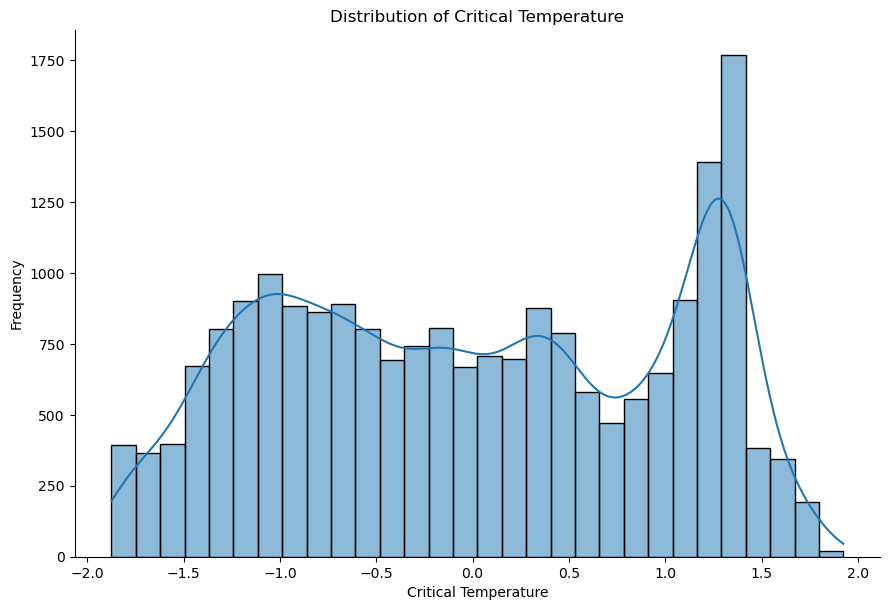

In [147]:
# distribution plot after transformation

sns.displot(df2['Critical_Temperature'], bins=30, kde=True, height=6, aspect=1.5) # Create the distribution
plt.title('Distribution of Critical Temperature')
plt.xlabel('Critical Temperature')
plt.ylabel('Frequency')
plt.show()

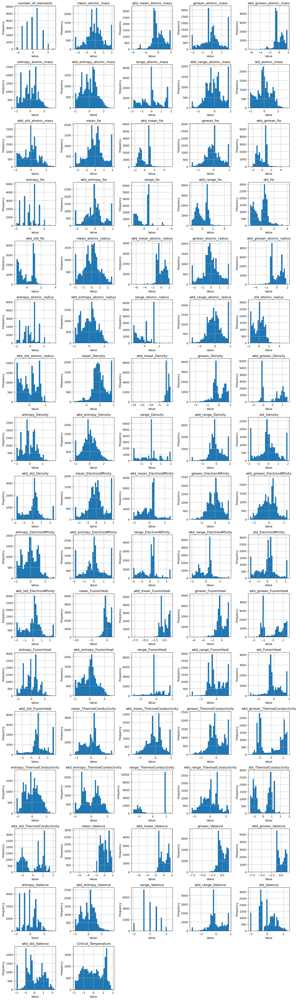

In [149]:
# Plot histograms after transformed features


# Set up the number of rows and columns for the subplot grid
n_cols = 5  # Number of columns in the grid (you can adjust this)
n_rows = (df2.shape[1] // n_cols) + (df2.shape[1] % n_cols > 0)  # Calculate number of rows

# Create the figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))  # Adjust figure size
axes = axes.flatten()  # Flatten to make iterating easier

# Loop through columns and plot each histogram
for i, column in enumerate(df2.columns):
    df2[column].hist(ax=axes[i], bins=30)
    axes[i].set_title(f'{column}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')

# Remove any empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

## 6. **Exploratory Data Analysis (EDA):**

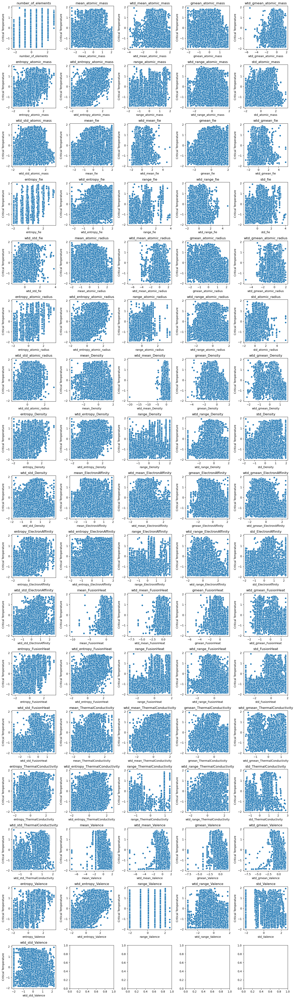

In [164]:
# generates scatter plots for each numerical feature

# List of numerical features (excluding 'Demand')
num_cols = [col for col in df2.columns if col != 'Critical_Temperature']

# Set up the number of rows and columns for the subplot grid
n_cols = 5  # Number of columns in the grid (you can adjust this)
n_rows = (df2.shape[1] // n_cols) + (df2.shape[1] % n_cols > 0)  # Calculate number of rows

# Create the figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))  # Adjust figure size
axes = axes.flatten()  # Flatten to make iterating easier

# Loop through columns and plot each histogram
for i, col in enumerate(num_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.scatterplot(data=df1, x=col, y='Critical_Temperature')
    plt.title(col)
    plt.xlabel(col)
    plt.ylabel('Critical Temperature')

# Adjust layout
plt.tight_layout()

# Save the plot as an image
plt.savefig("Scatter.png")

# Display the plot
plt.show()

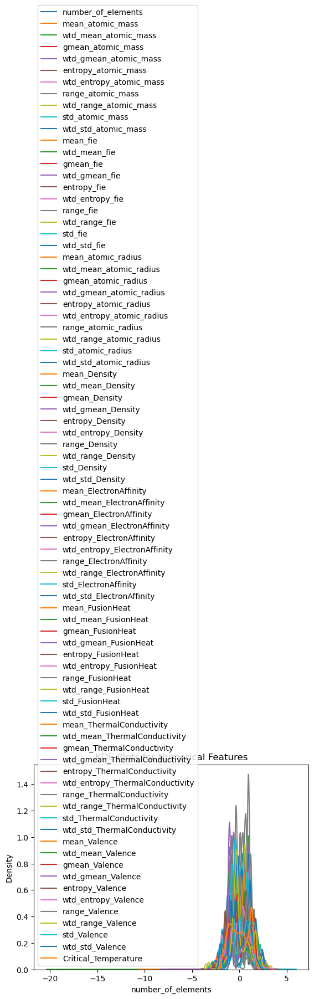

In [151]:
# to generate a Kernel Density Estimate (KDE) plot 

for column in df2.select_dtypes(include=['float64', 'int64']).columns:
    sns.kdeplot(df2[column], label=column)

plt.legend()
plt.title('KDE Plots for Numerical Features')
plt.show()

<Axes: xlabel='Critical_Temperature', ylabel='Density'>

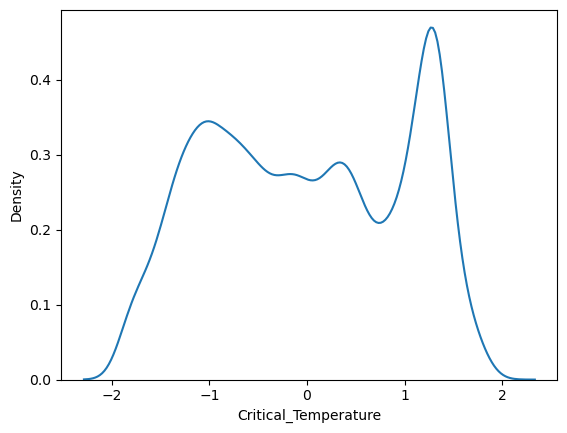

In [153]:
# to generate a Kernel Density Estimate (KDE) plot for target variable

sns.kdeplot(df2['Critical_Temperature'])

In [168]:
# calculates the correlation matrix for the numerical columns

corr1 = df2[numeric_columns].corr()

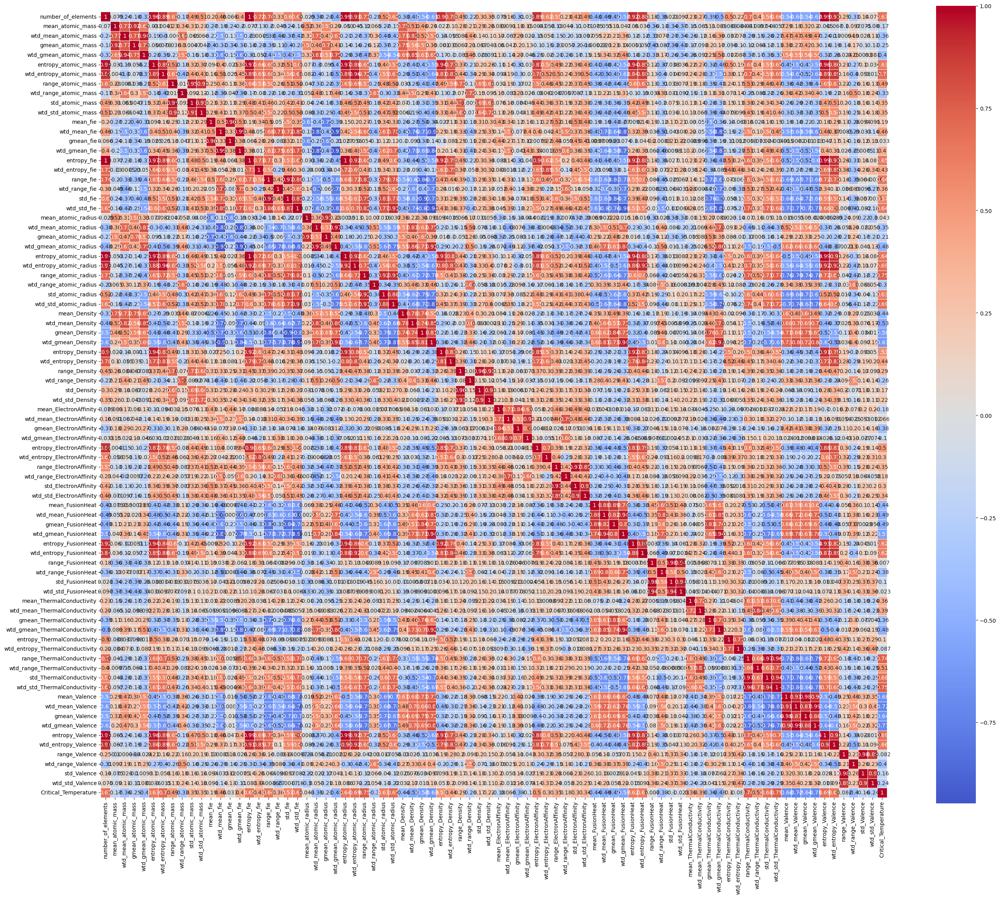

In [174]:
# Create the heatmap with annotations
plt.figure(figsize=(28,28))
sns.heatmap(corr1, annot=True, cmap='coolwarm', center=0, linewidths=0.5, cbar_kws={"shrink": 0.75}, square=True)

# Rotate x-axis and y-axis labels to make them readable
plt.xticks(rotation=90)
plt.yticks(rotation=0)

# Save the heatmap as an image
plt.savefig("corr.png")

# Show the plot
plt.tight_layout()  # To avoid overlap

# Display the heatmap
plt.show()

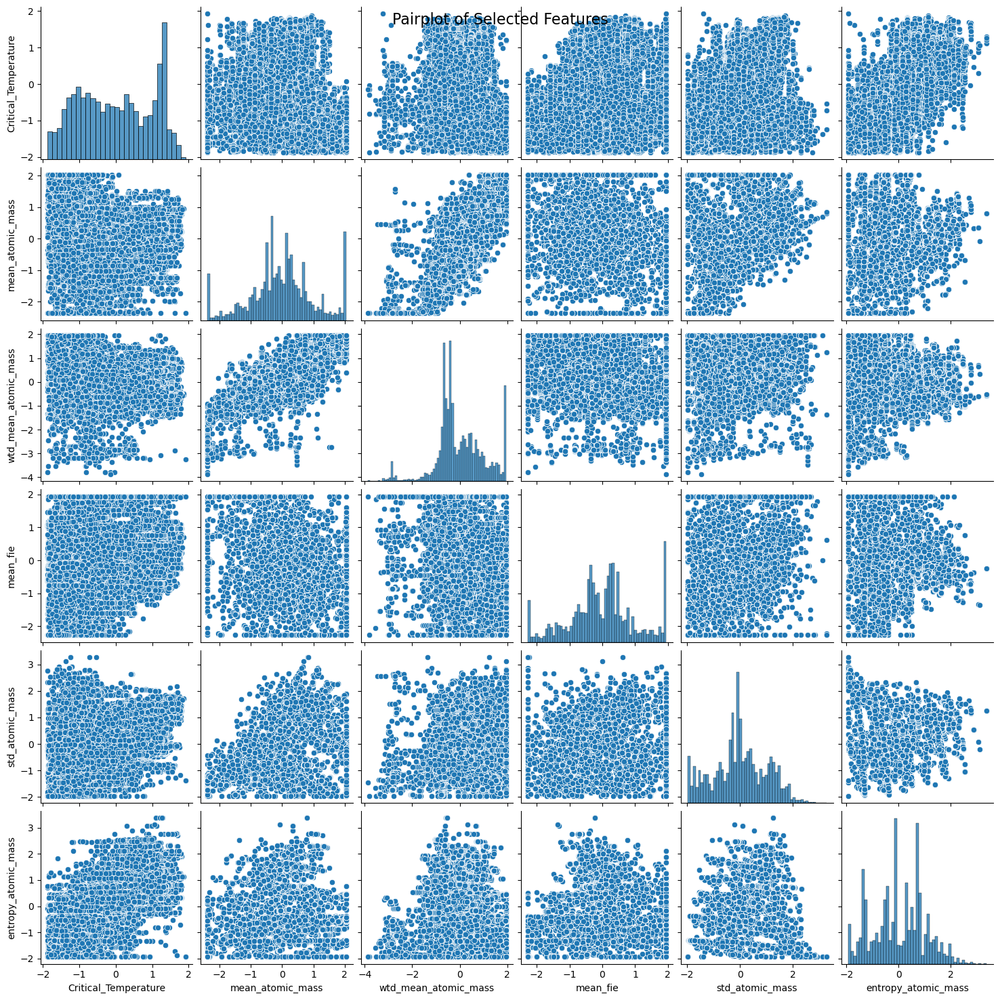

In [178]:
# Pairplot

subset = df2[['Critical_Temperature', 'mean_atomic_mass', 'wtd_mean_atomic_mass', 'mean_fie', 'std_atomic_mass', 'entropy_atomic_mass']]  
sns.pairplot(subset)
plt.suptitle("Pairplot of Selected Features", size=16)
plt.show()


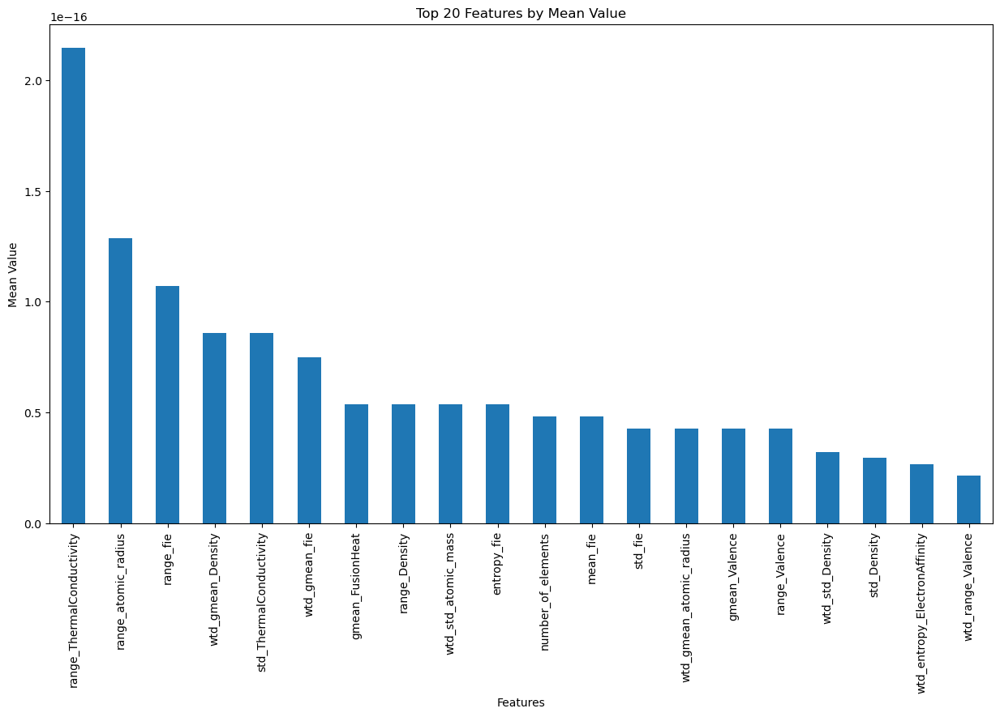

In [180]:
# Example: Bar plot for the mean of each feature

mean_values = df2.mean()
mean_values.sort_values(ascending=False).head(20).plot(kind='bar', figsize=(15, 8))
plt.title("Top 20 Features by Mean Value")
plt.xlabel("Features")
plt.ylabel("Mean Value")
plt.show()

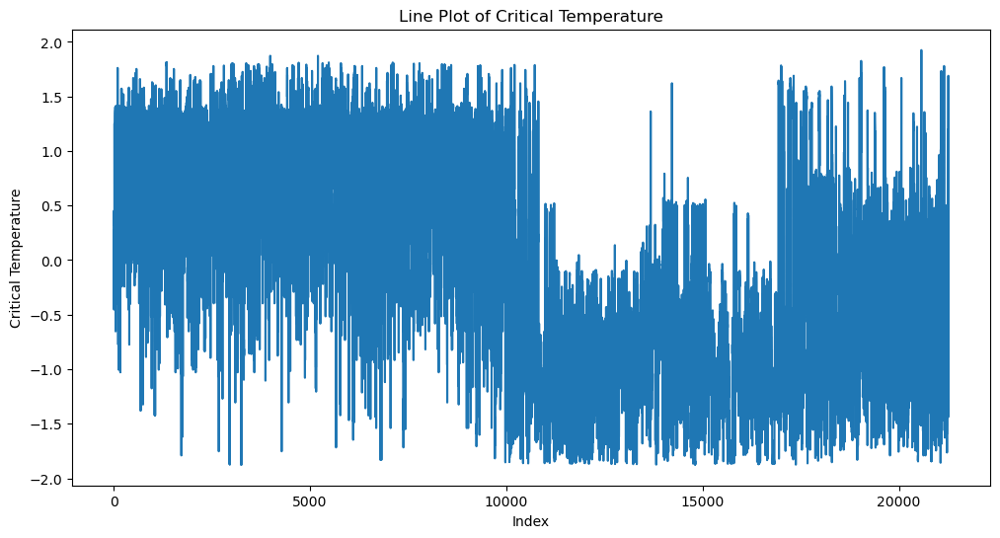

In [184]:
# Example: Line plot of 'critical_temp' over the index (if temporal data exists)

plt.figure(figsize=(12, 6))
sns.lineplot(data=df2['Critical_Temperature'])
plt.title('Line Plot of Critical Temperature')
plt.xlabel('Index')
plt.ylabel('Critical Temperature')
plt.show()


## 7. **Feature Engineering:**

In [187]:
# Identify categorical features

categorical_columns = df2.select_dtypes(include=['object', 'category']).columns
print("Categorical Columns:", categorical_columns)

Categorical Columns: Index([], dtype='object')


## 8. **Feature Selection:**

**Setting Target Value**

In [191]:
# Feature matrix (excluding the target column)
x = df2.drop(columns=['Critical_Temperature'])
y = df2['Critical_Temperature']

In [193]:
x

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,mean_Valence,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence
0,-0.094126,0.132080,-0.364780,-0.017530,-0.574337,-0.140655,-0.175508,0.022100,0.239869,0.311379,...,-1.085325,-0.713540,-0.930003,-0.657771,-0.007003,-0.149258,-0.806151,-0.225050,-0.817684,-0.385771
1,0.606480,0.276192,-0.338003,0.294642,-0.559147,0.779445,-0.187585,0.022100,0.456229,0.051036,...,-1.721136,-0.713540,-1.860364,-0.678016,0.610639,-0.202478,0.088564,-0.158323,-0.342700,-0.298473
2,-0.094126,0.132080,-0.363856,-0.017530,-0.574016,-0.140655,-0.392614,0.022100,0.436040,0.311379,...,-1.085325,-0.684160,-0.930003,-0.629493,-0.007003,-0.252093,-0.806151,-0.180318,-0.817684,-0.364364
3,-0.094126,0.132080,-0.364318,-0.017530,-0.574176,-0.140655,-0.278280,0.022100,0.339563,0.311379,...,-1.085325,-0.698790,-0.930003,-0.643595,-0.007003,-0.198000,-0.806151,-0.202559,-0.817684,-0.374837
4,-0.094126,0.132080,-0.365704,-0.017530,-0.574658,-0.140655,0.004112,0.022100,0.029479,0.311379,...,-1.085325,-0.743404,-0.930003,-0.686348,-0.007003,-0.063580,-0.806151,-0.270798,-0.817684,-0.409091
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21258,-0.094126,0.804169,-0.565985,0.710308,-0.227618,-0.154550,0.369546,0.510970,-0.764614,1.104627,...,0.410110,0.751483,0.573012,0.828486,0.019424,-0.549660,-0.806151,0.988332,-0.817684,-0.222621
21259,0.606480,0.258672,-0.747823,-0.090555,-0.760463,0.316096,1.473212,1.462616,-1.503366,1.315291,...,-1.200583,-1.205321,-1.038167,-1.107590,0.746947,0.730155,-0.806151,-0.533445,-0.901243,-1.103142
21260,-1.464090,0.536060,0.914161,1.418922,1.244109,-1.305773,-1.293423,-1.681181,1.177795,-1.724328,...,1.247173,1.267623,1.328084,1.315131,-1.438715,-1.458382,-0.806151,1.658327,-0.652659,-0.492192
21261,-1.464090,0.536060,0.956500,1.418922,1.270815,-1.305773,-1.100269,-1.681181,0.204723,-1.724328,...,1.247173,1.235214,1.328084,1.284419,-1.438715,-1.248974,-0.806151,1.021217,-0.652659,-0.315160


***Random Forest Regressor***

In [197]:
#  fit a Random Forest model

rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(x, y)

RandomForestRegressor(random_state=42)

In [198]:
# Get feature importance scores
importances = rf_model.feature_importances_

In [199]:
# Feature importance
feature_names = x.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print(feature_importance_df)

                          Feature  Importance
67      range_ThermalConductivity    0.619423
64  wtd_gmean_ThermalConductivity    0.066244
31                   mean_Density    0.038305
27            range_atomic_radius    0.013033
2            wtd_mean_atomic_mass    0.012557
..                            ...         ...
73                  gmean_Valence    0.000874
11                       mean_fie    0.000860
71                   mean_Valence    0.000350
77                  range_Valence    0.000282
0              number_of_elements    0.000043

[81 rows x 2 columns]


In [246]:
# Display the top features

print(feature_importance_df.head(20))

                            Feature  Importance
67        range_ThermalConductivity    0.619423
64    wtd_gmean_ThermalConductivity    0.066244
31                     mean_Density    0.038305
27              range_atomic_radius    0.013033
2              wtd_mean_atomic_mass    0.012557
74                wtd_gmean_Valence    0.012469
66  wtd_entropy_ThermalConductivity    0.012040
44       wtd_gmean_ElectronAffinity    0.008299
69          std_ThermalConductivity    0.008143
60               wtd_std_FusionHeat    0.007513
80                  wtd_std_Valence    0.007149
62     wtd_mean_ThermalConductivity    0.006663
50         wtd_std_ElectronAffinity    0.006043
78                wtd_range_Valence    0.005703
9                   std_atomic_mass    0.005697
72                 wtd_mean_Valence    0.005610
48       wtd_range_ElectronAffinity    0.005063
28          wtd_range_atomic_radius    0.004851
65      entropy_ThermalConductivity    0.004825
55               entropy_FusionHeat    0

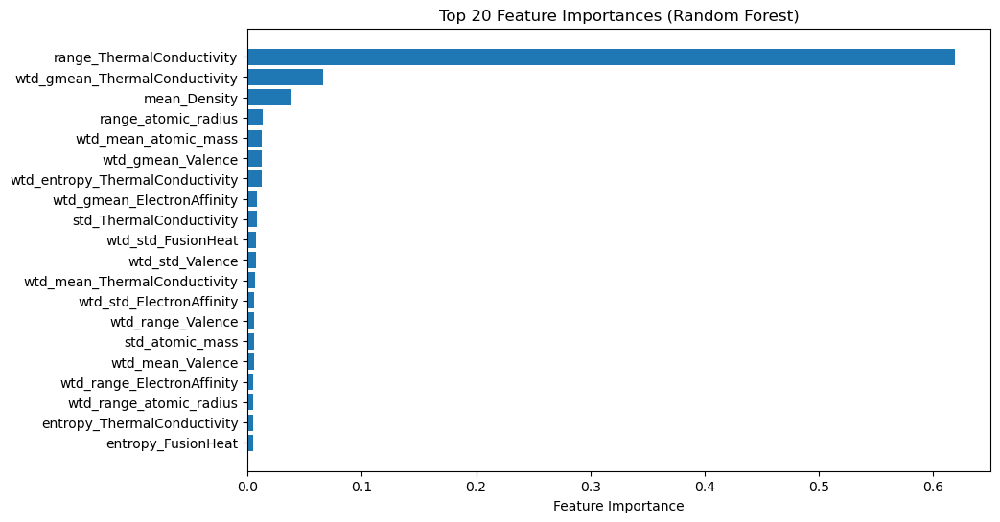

In [213]:
# Plot the feature importances for the top 50
top_n = 20

# Sort the features by importance
indices = importances.argsort()[-top_n:]

# Plot the top 50 feature importances
plt.figure(figsize=(10, 6))
plt.title(f"Top {top_n} Feature Importances (Random Forest)")
plt.barh(range(top_n), importances[indices], align="center")
plt.yticks(range(top_n), [x.columns[i] for i in indices])
plt.xlabel("Feature Importance")
plt.show()

In [225]:
# Selecting important features

threshold = 0.01  
selected_features = feature_importance_df[feature_importance_df['Importance'] > threshold]['Feature'].tolist()
x_selected = x[selected_features]


In [227]:
x_selected.columns

Index(['range_ThermalConductivity', 'wtd_gmean_ThermalConductivity',
       'mean_Density', 'range_atomic_radius', 'wtd_mean_atomic_mass',
       'wtd_gmean_Valence', 'wtd_entropy_ThermalConductivity'],
      dtype='object')

***Select KBest, f_Regression***

In [238]:
# Apply SelectKBest with the F-test for regression

k_best = SelectKBest(score_func=f_regression, k='all')  # You can adjust 'k' to select specific features
x_new = k_best.fit_transform(x, y)

In [240]:
# Get the scores for each feature

scores = k_best.scores_

In [242]:
# Create a DataFrame with feature names and their corresponding scores

feature_scores = pd.DataFrame({"Feature": x.columns, "Score": scores})
feature_scores = feature_scores.sort_values(by="Score", ascending=False)

In [248]:
# Display the top features

print(feature_scores.head(20))

                        Feature         Score
70  wtd_std_ThermalConductivity  27662.960514
27          range_atomic_radius  27516.602612
67    range_ThermalConductivity  25706.443736
72             wtd_mean_Valence  23403.095748
74            wtd_gmean_Valence  21023.694249
6       wtd_entropy_atomic_mass  20019.420757
30        wtd_std_atomic_radius  19076.911143
75              entropy_Valence  18987.605238
26    wtd_entropy_atomic_radius  18916.783742
69      std_ThermalConductivity  18360.436006
71                 mean_Valence  18011.555709
0            number_of_elements  17110.349348
76          wtd_entropy_Valence  16099.496868
15                  entropy_fie  15846.579125
25        entropy_atomic_radius  14908.811727
17                    range_fie  14838.302421
73                gmean_Valence  14833.263035
20                  wtd_std_fie  14599.820812
34            wtd_gmean_Density  14051.757368
5           entropy_atomic_mass  13907.200556


***Removing redundant or irrelevant features***

In [256]:
# Calculate the correlation matrix
corr_matrix = df2.corr()

# Set a correlation threshold (e.g., 0.95 for high correlation)
threshold = 0.95

# Get the indices of the upper triangle of the correlation matrix (since it's symmetrical)
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find columns with correlation greater than the threshold
to_drop = [column for column in upper.columns if any(upper[column] > threshold)]

print("Redundant features to drop:", to_drop)


Redundant features to drop: ['gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'entropy_atomic_mass', 'std_atomic_mass', 'wtd_std_atomic_mass', 'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'std_fie', 'gmean_atomic_radius', 'wtd_gmean_atomic_radius', 'entropy_atomic_radius', 'wtd_entropy_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius', 'wtd_gmean_Density', 'entropy_Density', 'std_Density', 'wtd_std_Density', 'wtd_gmean_ElectronAffinity', 'std_ElectronAffinity', 'wtd_std_ElectronAffinity', 'wtd_gmean_FusionHeat', 'entropy_FusionHeat', 'wtd_entropy_FusionHeat', 'std_FusionHeat', 'wtd_std_FusionHeat', 'wtd_gmean_ThermalConductivity', 'std_ThermalConductivity', 'wtd_std_ThermalConductivity', 'wtd_mean_Valence', 'gmean_Valence', 'wtd_gmean_Valence', 'entropy_Valence', 'wtd_entropy_Valence', 'std_Valence', 'wtd_std_Valence']


In [252]:

# Drop the redundant features
df3 = df2.drop(columns=to_drop)

In [254]:
df3.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,wtd_std_atomic_mass,...,wtd_entropy_ThermalConductivity,range_ThermalConductivity,wtd_range_ThermalConductivity,mean_Valence,wtd_mean_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,wtd_std_Valence,Critical_Temperature
0,-0.094126,0.132080,-0.364780,-0.017530,-0.574337,-0.175508,0.0221,0.239869,0.311379,0.564703,...,-0.854387,0.956302,0.051322,-1.085325,-0.713540,-0.149258,-0.806151,-0.225050,-0.385771,0.267623
1,0.606480,0.276192,-0.338003,0.294642,-0.559147,-0.187585,0.0221,0.456229,0.051036,0.585112,...,0.189059,1.325746,-0.091699,-1.721136,-0.713540,-0.202478,0.088564,-0.158323,-0.298473,0.177084
2,-0.094126,0.132080,-0.363856,-0.017530,-0.574016,-0.392614,0.0221,0.436040,0.311379,0.566627,...,-0.901845,0.956302,0.051322,-1.085325,-0.684160,-0.252093,-0.806151,-0.180318,-0.364364,-0.069596
3,-0.094126,0.132080,-0.364318,-0.017530,-0.574176,-0.278280,0.0221,0.339563,0.311379,0.565665,...,-0.876592,0.956302,0.051322,-1.085325,-0.698790,-0.198000,-0.806151,-0.202559,-0.374837,0.043232
4,-0.094126,0.132080,-0.365704,-0.017530,-0.574658,0.004112,0.0221,0.029479,0.311379,0.562777,...,-0.816470,0.956302,0.051322,-1.085325,-0.743404,-0.063580,-0.806151,-0.270798,-0.409091,0.078299


## 9. **Split Data into Training and Testing Sets:**

In [269]:
# Feature matrix and target variable

X = df3.drop(columns=['Critical_Temperature'])  # Features (independent variables)
Y = df3['Critical_Temperature']  # Target (dependent variable)

In [271]:
# Split the data into training (80%) and testing (20%) sets

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [273]:
# Print the shape of the training and testing sets
print("Training features shape:", X_train.shape)
print("Testing features shape:", X_test.shape)
print("Training target shape:", Y_train.shape)
print("Testing target shape:", Y_test.shape)

Training features shape: (16957, 64)
Testing features shape: (4240, 64)
Training target shape: (16957,)
Testing target shape: (4240,)


## 10. **Feature Scaling:**

In [276]:
# Instantiate the StandardScaler

scaler = StandardScaler()

In [278]:
# Fit and transform the training data, and transform the test data

X_train_scaled = scaler.fit_transform(X_train)  # Fit and scale training data
X_test_scaled = scaler.transform(X_test)  # Use the fitted scaler to scale test data

In [284]:
# the list of selected features, make sure it matches the number of features in X_train_scaled

selected_features = X_train.columns.tolist()  # This will give the correct column names

In [286]:
# to check the transformed data

X_standardized = pd.DataFrame(X_train_scaled, columns=selected_features)
X_standardized

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,wtd_std_atomic_mass,...,entropy_ThermalConductivity,wtd_entropy_ThermalConductivity,range_ThermalConductivity,wtd_range_ThermalConductivity,mean_Valence,wtd_mean_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,wtd_std_Valence
0,-1.461988,1.860928,1.692942,1.766010,1.636190,-1.003435,-0.595997,-1.391957,-0.111346,-0.043961,...,-0.142164,0.477129,-1.385210,-1.364574,1.451450,1.321236,-1.096198,-2.031635,0.083827,-1.996156
1,-0.094055,-0.358066,-0.643470,-0.353344,-0.634796,0.486823,-0.013399,-0.857079,-0.121269,0.044836,...,-1.187495,-1.087849,0.956990,0.833514,-1.089076,-1.136322,0.270486,-0.806490,-0.657484,-0.913926
2,2.029688,0.093959,0.488721,0.103108,0.573527,1.583190,1.520527,-0.272232,0.595341,0.450119,...,1.856446,0.897050,0.956990,1.242343,-0.718136,-0.633525,2.552816,0.087190,-1.394402,0.174908
3,-0.094055,-1.886871,-1.226692,-1.839524,-0.876294,0.142593,-0.768220,-0.611509,-0.771072,-0.678510,...,-0.980214,-0.568090,-0.848724,-0.285881,0.407726,0.382707,0.589284,1.448497,-0.685207,1.597527
4,-0.094055,-0.355139,-0.409832,-0.355627,-0.594602,-0.384588,0.016802,0.396621,-0.097804,0.497865,...,-0.995467,-0.782153,0.956990,0.051249,-1.089076,-0.704237,-0.201671,-0.806490,-0.203993,-0.376514
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16952,-1.461988,-2.378969,-2.030393,-2.080948,-1.240960,-1.058465,-1.823294,-1.608088,-1.921265,-1.818208,...,-0.196143,0.346419,-1.085466,0.507815,-0.585815,-0.129005,-1.173892,-0.806490,-0.369011,-0.244262
16953,-0.094055,2.038517,1.541175,1.766010,1.546090,0.739088,-0.359875,-1.056215,0.179644,-0.019307,...,1.829116,1.802452,-1.010437,-0.309505,1.685744,1.462486,0.490412,-0.806490,0.334805,-0.259634
16954,0.605512,0.380866,-0.404360,0.304039,-0.536636,1.144426,0.725026,-0.846903,0.477166,0.514815,...,-0.184511,-0.700959,0.956990,0.860780,-1.204440,-1.133386,0.551033,-0.806490,-0.375665,-0.907791
16955,-0.094055,0.267403,-0.242869,0.061276,-0.534161,-0.342778,0.243152,0.480233,0.498879,0.829943,...,-1.409430,-0.924797,0.956990,0.051249,-0.183109,-0.619436,-0.062496,0.087190,-0.274408,-0.202852
